This post is devoted to te comparison of simulation results obtained by the following numerical methods:

* Explicit and implicit Euler methods,
* Trapezoidal rule,
* Midpoint rule,
* Discrete gradient method combined with PHS structure.

Results are given in *Python* code.

<!-- TEASER_END -->

# Import external modules

In [1]:
import sympy as sp  # Symbolic computation module
import numpy as np  # Numerical computation module
from scipy.optimize import root  # Solver for implicit functions
import matplotlib.pyplot as plt  # Figures rendering
# Figures rendering inline
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
# Latex outputs
from sympy import init_printing
init_printing(use_latex='mathjax')

# Parameters

In [2]:
# Hamiltonian
c11, c12 = 10, 1
c21, c22 = 1, 1

# Initialisation
x0 = np.array((8., 0.))

# Samplerate
fs = 10.
ts = fs**-1

# number of time-steps
nt = int(200*fs/5.)

# System definition
$\frac{\mathrm d \mathbf x}{\mathrm d t} = \mathbf{J_x}\,\nabla\mathrm H(\mathbf x)$

## Define symbols for the state

$\mathbf{x} = \left(\begin{array}{c} x_1\\ x_2\end{array}\right)$

In [3]:
# State
x = sp.symbols(['x1', 'x2'])
x

[x₁, x₂]

## Define Hamiltonian function

$
\begin{array}{rcl}
\mathrm H_1(x_1) &=& c_{1,1}\,\log\big(\cosh(c_{1,2}\,x_1)\big) \\
\mathrm H_2(x_2) &=& c_{2,1}\,\big(\cosh(c_{2,2}\,x_2)-1\big) \\
\mathrm H(\mathbf{x}) &=& \mathrm H_1(x_1) + \mathrm H_2(x_2)\\
\end{array}
$

H = 10*log(cosh(x1)) + cosh(x2) - 1


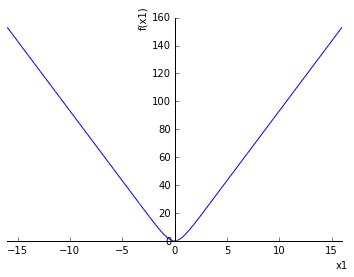

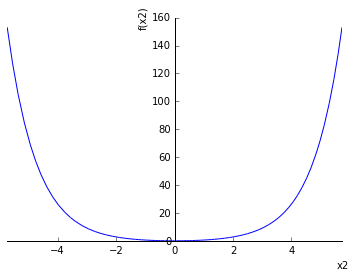

In [4]:
# Hamiltonian
H1 = c11*sp.log(sp.cosh(c12*x[0]))
H2 = c21*(sp.cosh(c22*x[1])-1)
H = H1 + H2

# define plots limits
lim_x1 = 2*x0[0]
H_lim = H1.subs(x[0], lim_x1)
lim_x2 = max(sp.solve(H2-H_lim, x[1]))
lims = (float(lim_x1), float(lim_x2))

# plot Hamiltonian components 
print 'H =', H
sp.plot(H1, (x[0], -lims[0], lims[0]))
sp.plot(H2, (x[1], -lims[1], lims[1]))

## Compute Hamiltonian's gradient
$\nabla\mathrm H(\mathbf x) = \left(\begin{array}{c} \frac{\partial \mathrm H(\mathbf x)}{\partial x_1}\\ \frac{\partial \mathrm H(\mathbf x)}{\partial x_2}\end{array}\right) $

In [5]:
# Hamiltonian's gradient
dxH1 = H.diff(x[0])
dxH2 = H.diff(x[1])
dxH = sp.Matrix([[dxH1],[dxH2]])

dxH

⎡10⋅sinh(x₁)⎤
⎢───────────⎥
⎢  cosh(x₁) ⎥
⎢           ⎥
⎣ sinh(x₂)  ⎦

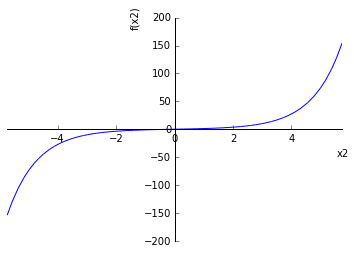

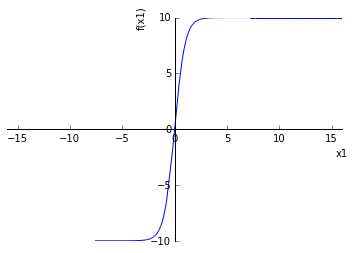

In [6]:
sp.plot(dxH2, (x[1], -lims[1], lims[1]))
sp.plot(dxH1, (x[0], -lims[0], lims[0]))

## Define structure matrix
$\mathbf{J_x}= \left(\begin{array}{rr} 0 & -1\\ +1&0\end{array}\right)$

In [7]:
# Structure matrix
Jx = sp.zeros(2)
Jx[0,1] = -1
Jx[1,0] = 1
Jx

⎡0  -1⎤
⎢     ⎥
⎣1  0 ⎦

# Build numerical evaluation of symbolic expressions

In [8]:
# Numerical evaluations of the Hamiltonian
H_num = sp.lambdify(x, H, "numpy", dummify=False)

# Numerical evaluations of the Hamiltonian's gradient
dxH_num = sp.lambdify(x, dxH, "numpy", dummify=False)

# Numerical evaluations of the structure matrix
Jx_num = sp.matrix2numpy(Jx, dtype = float)

# Plot functions

In [9]:
def get_data(x):
    "return x1, x2 and H(x1, x2) for all x  such that x_i is in [-limsi, limisi], i=(1, 2)"
    x1 = [el[0] for el in x]
    x2 = [el[1] for el in x]
    
    if np.max(np.abs(x1))>np.max(np.abs(lims[0])):
        indlimitx1 = map(lambda x: x<np.max(np.abs(lims[0])), np.abs(x1)).index(False)
    else:
        indlimitx1 = len(x1)
        
    if np.max(np.abs(x2))>np.max(np.abs(lims[1])):
        indlimitx2 = map(lambda x: x<np.max(np.abs(lims[1])), np.abs(x2)).index(False)
    else:
        indlimitx2 = len(x2)
    indlimitx = np.min([indlimitx1, indlimitx2])
    x1 = x1[:indlimitx]
    x2 = x2[:indlimitx]
    H = map(lambda xk1, xk2: H_num(xk1, xk2), x1, x2)
    return x1, x2, H
    
def plot_H_surface(ax):
    '''
    Plot the surface H(x1, x2).
    axe is a 3D matplotlib.pyplot.axes (x1, x2, H) for -limsx1<x1<limsx1, -limsx2<x2<limsx2."'''
    from matplotlib import cm
    npplot = 200
    xp1 = np.linspace(-lims[0], lims[0], npplot)
    xp2 = np.linspace(-lims[1], lims[1], npplot)
    X1, X2 = np.meshgrid(xp1, xp2)
    HH = np.zeros(X1.shape)
    for i in range(npplot):
        for j in range(npplot):
            HH[j, i] = H_num(xp1[i], xp2[j])
    surf = ax.plot_surface(X1, X2, HH, rstride=1, cstride=1, cmap=cm.BuPu,
                           linewidth=0, antialiased=True, alpha=0.6)

def plot_traj_3D(x, title=None):
    " 3D plot of energy and the given state trajectory, with state space as base"
    from mpl_toolkits.mplot3d import Axes3D
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    plot_H_surface(ax)    
    x1, x2, H = get_data(x)
    ax.plot_wireframe(np.array(x1), np.array(x2), H)
    ax.plot_wireframe(np.array(x1), np.array(x2), 0)
    ax.scatter(np.array(x1[:1]), np.array(x2[:1]), H[:1], c='r', marker='x')
    ax.scatter(np.array(x1[:1]), np.array(x2[:1]), 0, c='r', marker='x')

    ax.set_xlim(-lims[0], lims[0])
    ax.set_ylim(-lims[1], lims[1])
#    ax.set_zlim(0, 2*H[0])

    ax.set_xlabel('x1')
    ax.set_ylabel('x2')
    ax.set_zlabel('H(x1, x2)')
    
    if title is not None:
        plt.title(title)
        plt.savefig(title + '3D_fs' + str(fs) + '.pdf')
    
def plot_contour():
    '''
    Plot the surface H(x1, x2).
    axe is a 3D matplotlib.pyplot.axes (x1, x2, H) for -limsx1<x1<limsx1, -limsx2<x2<limsx2."'''
    from pylab import contourf
    Nticks = 100.
    axe_x1 = np.linspace(-lims[0], lims[0], Nticks)
    axe_x2 = np.linspace(-lims[1], lims[1], Nticks)
    X, Y = np.meshgrid(axe_x1, axe_x2)
    Z = H_num(X, Y)
    cmap = 'BuPu'
    alpha = 1
    NLevels = 30
    linestyles = 'dash'
    from pylab import contourf
    contourf(X, Y, Z, 
             NLevels, alpha=alpha, linestyles=linestyles , antialiased=False,  cmap=cmap)

def plot_traj_2D(x, title=None, ax=None):
    "Plot the trajectory of state x in state space x1=x[0], x2=x[1]."
    if ax == None:
        fig = plt.figure()
        ax = plt.axes()

    ax.set_xlabel(r'x1')
    ax.set_ylabel(r'x2')
    ax.plot(0,0,'ko')
    plot_contour()
    ax.set_xlim(-lims[0], lims[0])
    ax.set_ylim(-lims[1], lims[1])
    x1, x2, _ = get_data(x)
    ax.plot(x1, x2, '-b')
    ax.plot(x1[0],x2[0],'ro')
    ax.set_xlabel('x1')
    ax.set_ylabel('x2')    
    if title is not None:
        plt.title(title)
        plt.savefig(title + '2D_fs' + str(fs) + '.pdf')
        
def plot_trajs(x, title=None):
    plot_traj_3D(x, title=title)
    plot_traj_2D(x, title=title)
    
def rel_delta_energy(x):
    "get sequence of H(x) and return sequence of errors on energy conservation"
    _, _, H = get_data(x)
    return abs(np.diff(H)/H[0])

def plot_delta_energy(ax=None):
    # time vector
    nt_here = int(nt/7)
    t = np.linspace(0, (nt_here-1)*ts, nt_here)
    if ax == None:
        ax = plt.axes()
    deltaH = rel_delta_energy(x_shp[:nt_here])
    ax.semilogy(t[:len(deltaH)], deltaH,'-',label=r'Disc. grad.',linewidth=2)
    deltaH = rel_delta_energy(x_midpoint[:nt_here])
    ax.semilogy(t[:len(deltaH)], deltaH,'--',label=r'Midpoint',linewidth=2)
    deltaH = rel_delta_energy(x_trapez[:nt_here])
    ax.semilogy(t[:len(deltaH)], deltaH,'-.',label=r'Trapezoidal',linewidth=2)
    deltaH = rel_delta_energy(x_euler_imp[:nt_here])
    ax.semilogy(t[:len(deltaH)], deltaH,':',label=r'Euler impl.',linewidth=2)
    deltaH = rel_delta_energy(x_euler_exp[:nt_here])
    ax.semilogy(t[:len(deltaH)], deltaH,'--',label=r'Euler expl.',linewidth=2)
#    ax.legend(loc=0)
    ax.set_title(r'$\epsilon_k = ({\mathrm{H}(\mathbf{x}_{k+1})-\mathrm{H}(\mathbf{x}_k)})/{\mathrm{H}(\mathbf{x}_0)}$', fontsize=18)
    ax.set_ylabel(r'$\epsilon_k$')
    ax.set_xlabel(r'time $t$ (s)')
    import matplotlib
    matplotlib.rcParams.update({'font.size': 18})
    ax.legend(loc=1, fontsize=13)

# Numerical methods

## Explicit Euler
$ \frac{\delta \mathbf x_k}{\delta t} = \mathbf{J_x}\,\nabla\mathrm H(\mathbf x_k)\quad \Rightarrow \quad \delta \mathbf x_k = \delta t\,\mathbf{J_x}\,\nabla\mathrm H(\mathbf x_k)$

/Users/Falaize/anaconda/lib/python2.7/site-packages/numpy/__init__.py:1: RuntimeWarning: overflow encountered in sinh
  """
/Users/Falaize/anaconda/lib/python2.7/site-packages/numpy/__init__.py:1: RuntimeWarning: overflow encountered in cosh
  """
/Users/Falaize/anaconda/lib/python2.7/site-packages/numpy/__init__.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """
/Users/Falaize/anaconda/lib/python2.7/site-packages/numpy/__init__.py:1: RuntimeWarning: overflow encountered in cosh
  """
/Users/Falaize/anaconda/lib/python2.7/site-packages/mpl_toolkits/mplot3d/proj3d.py:161: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


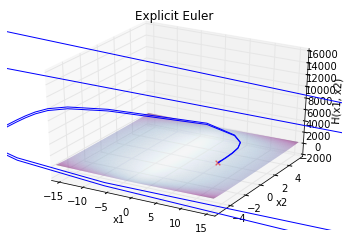

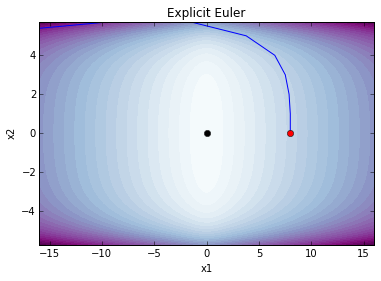

In [10]:
def f_euler_exp(x, dt):
    "State update with explicit Euler method"
    x = x.flatten()
    dx = dt*np.dot(Jx_num, dxH_num(x[0], x[1]))
    return dx.flatten()

# Init list of (x1(k), x2(k))
x_euler_exp = list()
x_euler_exp.append(x0)

# Simulation
for k in np.arange(nt):
    dx = f_euler_exp(x_euler_exp[k], ts)
    x_euler_exp.append(x_euler_exp[k] + dx)
    
plot_trajs(x_euler_exp, 'Explicit Euler')


## Implicit relation for the implicit Euler method
$\left\{\begin{array}{rcl}
 \frac{\delta \mathbf x_k}{\delta t} &=& \mathbf{J_x}\,\nabla\mathrm H(\mathbf x_{k+1}) \\ \mathbf x_{k+1} &=& \mathbf x_k + \delta \mathbf x_k \end{array}\right.\quad \Rightarrow \quad \mathbf x_{k+1}-\mathbf x_{k}-\delta t\,\mathbf{J_x}\,\nabla\mathrm H(x_{k+1}) = 0$

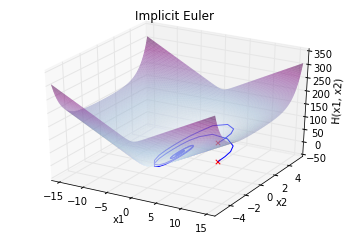

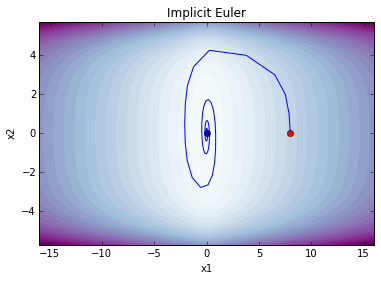

In [11]:
def f_euler_imp(xpost, x, ts):
    "Implicit function associated to state update with implicit Euler method"
    x = x.flatten()
    xpost = xpost.flatten()
    dx = f_euler_exp(xpost, ts)
    return xpost - x - dx

# Init list of (x1(k), x2(k))
x_euler_imp = list()
x_euler_imp.append(x0)

# Simulation
for k in np.arange(nt):
    xpost_init = x_euler_imp[k]
    args = (x_euler_imp[k], ts)
    sol = root(f_euler_imp, xpost_init, args=args) 
    xpost = sol.x    
    x_euler_imp.append(xpost)
    
plot_trajs(x_euler_imp, 'Implicit Euler')

## Midpoint rule
$\left\{\begin{array}{rcl}
 \frac{\delta \mathbf x_k}{\delta t} &=& \mathbf{J_x}\,\nabla\mathrm H\left(\frac{\mathbf x_{k+1}+\mathbf x_{k}}{2}\right) \\ \mathbf x_{k+1} &=& \mathbf x_k + \delta \mathbf x_k \end{array}\right.\quad \Rightarrow \quad \mathbf x_{k+1}- \mathbf x_{k}-\delta t\,\mathbf{J_x}\,\nabla\mathrm H\left(\frac{\mathbf x_{k+1}+\mathbf x_{k}}{2}\right) = 0$

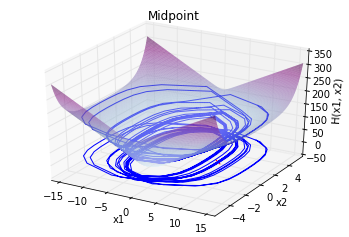

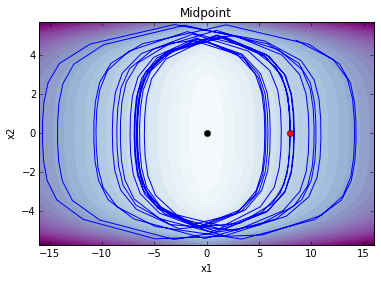

In [12]:
def f_midpoint(xpost, x, ts):
    "Implicit function associated to state update with implicit Euler method"
    x = x.flatten()
    xpost = xpost.flatten()
    dx = f_euler_exp((x+xpost)/2., ts)
    return xpost - x - dx

# Init list of (x1(k), x2(k))
x_midpoint = list()
x_midpoint.append(x0)

# Simulation
for k in np.arange(nt):
    xpost_init = x_midpoint[k]
    args = (x_midpoint[k], ts)
    sol = root(f_midpoint, xpost_init, args=args) 
    xpost = sol.x    
    x_midpoint.append(xpost)
    
plot_trajs(x_midpoint, 'Midpoint')

## Trapezoidal rule
$\left\{\begin{array}{rcl}
 \frac{\delta \mathbf x_k}{\delta t} &=& \mathbf{J_x}\,\left(\frac{\nabla\mathrm H(\mathbf x_{k})+\nabla\mathrm H(\mathbf x_{k+1})}{2}\right) \\ \mathbf x_{k+1} &=& \mathbf x_k + \delta \mathbf x_k \end{array}\right.\quad \Rightarrow \quad \mathbf x_{k+1}-\mathbf x_{k}-\delta t\,\mathbf{J_x}\,\left(\frac{\nabla\mathrm H(\mathbf x_{k})+\nabla\mathrm H(\mathbf x_{k+1})}{2}\right)= 0$

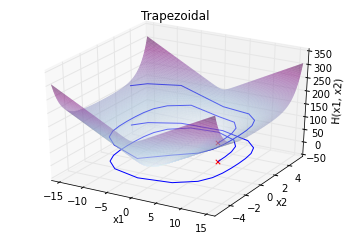

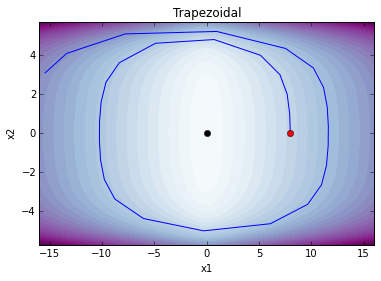

In [13]:
def f_trapez(xpost, x, ts):
    x = x.flatten()
    xpost = xpost.flatten()
    dx = (f_euler_exp(x, ts) + f_euler_exp(xpost, ts))/2.
    return xpost - x - dx

# Init list of (x1(k), x2(k))
x_trapez = list()
x_trapez.append(x0)

# Simulation
for k in np.arange(nt):
    xpost_init = x_trapez[k]
    args = (x_trapez[k], ts)
    sol = root(f_trapez, xpost_init, args=args) 
    xpost = sol.x    
    x_trapez.append(xpost)
    
plot_trajs(x_trapez, 'Trapezoidal')

## Discrete gradient method combined with (port-)Hamiltonian structure
$[\nabla_d\mathrm H(\mathbf x_k, \delta\mathbf x_k)]_i=\left\{\begin{array}{rl}
 \frac{\mathrm H(\mathbf x_k+\delta x_{k,i})-\mathrm H(\mathbf x_k)}{\delta x_{k,i}} &\mbox{if  } \delta x_{k,i}>\mathtt{eps}, \\ \frac{\partial \mathrm H(\mathbf x_k)}{\partial x_i} &\mbox{either.}\end{array}\right.\quad \Rightarrow \quad \mathbf x_{k+1}-\mathbf x_{k}-\delta t\,\mathbf{J_x}\,\nabla_d\mathrm H(\mathbf x_k, \delta\mathbf x_k)= 0$

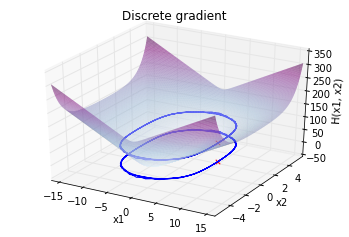

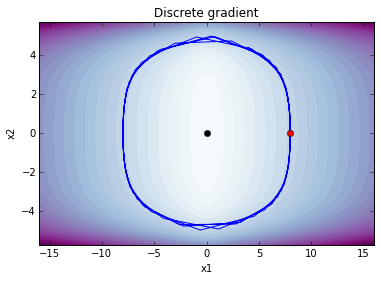

In [14]:
# Machine epsilon
eps = np.finfo(float).eps

def discretgradient(x, dx):
    "Numerical evaluation of the discrete gradient of the Hamiltonian as defined in (22)"
    x = x.flatten()
    dx = dx.flatten()
    dxH1 = (H_num(x[0]+dx[0], x[1])-H_num(x[0], x[1]))/dx[0] if dx[0]**2 > eps else dxH_num(x[0], x[1])[0,0]
    dxH2 = (H_num(x[0], x[1]+dx[1])-H_num(x[0], x[1]))/dx[1] if dx[1]**2 > eps else dxH_num(x[0], x[1])[1,0]
    return np.array([dxH1, dxH2])

def f_shp(xpost, x, ts):
    x = x.flatten()
    xpost = xpost.flatten()
    dx = ts*np.dot(Jx_num, discretgradient(x, xpost-x))
    return xpost - x - dx

# Init list of (x1(k), x2(k))
x_shp = list()
x_shp.append(x0)

# Simulation
for k in np.arange(nt):
    xpost_init = x_shp[k]
    args = (x_shp[k], ts)
    sol = root(f_shp, xpost_init, args=args) 
    xpost = sol.x    
    x_shp.append(xpost)
    
plot_trajs(x_shp, 'Discrete gradient')

# Results

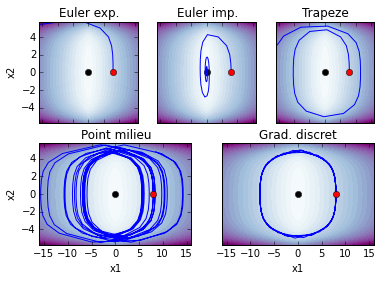

In [15]:
from matplotlib.pyplot import figure, tight_layout, savefig

fig = figure()
ax = fig.add_subplot(2,3,1)
plot_traj_2D(x_euler_exp, title='Euler exp.', ax=ax)
ax.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
#    bottom='off',      # ticks along the bottom edge are off
#    top='off',         # ticks along the top edge are off
    labelbottom='off') # labels along the bottom edge are off
ax.set_xlabel('')
ax = fig.add_subplot(2,3,2)
plot_traj_2D(x_euler_imp, title='Euler imp.', ax=ax)
ax.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
#    bottom='off',      # ticks along the bottom edge are off
#    top='off',         # ticks along the top edge are off
    labelbottom='off') # labels along the bottom edge are off
ax.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
#    bottom='off',      # ticks along the bottom edge are off
#    top='off',         # ticks along the top edge are off
    labelbottom='off') # labels along the bottom edge are off
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(list())
ax = fig.add_subplot(2,3,3)
ax = fig.add_subplot(2,3,3)
plot_traj_2D(x_trapez, title='Trapeze', ax=ax)
ax.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
#    bottom='off',      # ticks along the bottom edge are off
#    top='off',         # ticks along the top edge are off
    labelbottom='off') # labels along the bottom edge are off
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(list())
ax = fig.add_subplot(2,2,3)
plot_traj_2D(x_midpoint, title='Point milieu', ax=ax)
ax = fig.add_subplot(2,2,4)
plot_traj_2D(x_shp, title='Grad. discret', ax=ax)
ax.set_ylabel('')
ax.set_yticks(list())
#tight_layout()
savefig('fs' + str(fs) + '.pdf')

## Error on the energy balance
$\epsilon_k = \frac{\mathrm H(\mathbf x_{k+1})-\mathrm H(\mathbf x_k)}{\mathrm H(\mathbf x_0)}$

/Users/Falaize/anaconda/lib/python2.7/site-packages/matplotlib/scale.py:93: RuntimeWarning: invalid value encountered in less_equal
  mask = a <= 0.0


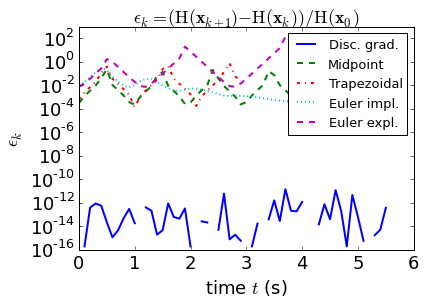

In [16]:
ax = plt.axes()
plot_delta_energy(ax=ax)
plt.savefig('error_energy_' + str(fs) + '.pdf')